<a href="https://colab.research.google.com/github/nouran551/hard-hat-detection/blob/master/hard_hat_detection_fastai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

'nvidia-smi' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
pip install object-detection-fastai

  Using cached object_detection_fastai-0.0.10-py3-none-any.whl (32 kB)
  Using cached fastai-1.0.61-py3-none-any.whl (239 kB)
  Using cached fastprogress-1.0.2-py3-none-any.whl (12 kB)
  Using cached nvidia-ml-py3-7.352.0.tar.gz (19 kB)
  Created wheel for nvidia-ml-py3: filename=nvidia_ml_py3-7.352.0-py3-none-any.whl size=19191 sha256=5ad56bfb0aeab002f2698f8fed0a64d0768214cf34959e4435dbf1ae09570629
  Stored in directory: c:\users\admin\appdata\local\pip\cache\wheels\b9\b1\68\cb4feab29709d4155310d29a421389665dcab9eb3b679b527b
Successfully built nvidia-ml-py3
Note: you may need to restart the kernel to use updated packages.


In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import sys
import csv
import random
#from google.colab import drive
 
import subprocess
 
from tqdm.notebook import tqdm
from xml.etree.ElementTree import parse
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.image as immg
from fastai.vision import *
from fastai import *
 
from pathlib import Path
from fastai.callbacks import *
from sklearn.model_selection import StratifiedKFold,KFold
         
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric

In [5]:
#from google.colab import drive
#drive.mount('/content/gdrive')

In [6]:
#drive.mount('/content/gdrive')
path='D:/Thirumalai/72075/04032022/TESTING/_annotations.csv'
path_img='D:/Thirumalai/72075/04032022/TESTING/train/'
path_all='D:/Thirumalai/72075/04032022/TESTING'
path_test = 'D:/Thirumalai/72075/04032022/TESTING/test/'

In [7]:
annotation= pd.read_csv(path)
annotation.shape

(20231, 8)

In [8]:
annotation.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,500,375,head,301,100,330,135
1,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,500,375,head,340,121,370,158
2,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,500,375,head,199,111,223,137
3,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,500,375,head,277,109,295,132
4,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,500,375,head,154,116,174,141


In [9]:
df = annotation.drop(['width','height'], axis = 1)
df.head()

,filename,class,xmin,ymin,xmax,ymax
0,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,head,301,100,330,135
1,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,head,340,121,370,158
2,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,head,199,111,223,137
3,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,head,277,109,295,132
4,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,head,154,116,174,141


In [10]:
df = df [['filename','xmin','ymin','xmax','ymax','class']]
df.head()

,filename,xmin,ymin,xmax,ymax,class
0,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,301,100,330,135,head
1,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,340,121,370,158,head
2,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,199,111,223,137,head
3,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,277,109,295,132,head
4,004858_jpg.rf.002ab521984d81c7400faa6f916f5a01...,154,116,174,141,head


In [11]:
arr = df["filename"].to_numpy()
print(arr)
arr.shape

['004858_jpg.rf.002ab521984d81c7400faa6f916f5a01.jpg' '004858_jpg.rf.002ab521984d81c7400faa6f916f5a01.jpg'
 '004858_jpg.rf.002ab521984d81c7400faa6f916f5a01.jpg' '004858_jpg.rf.002ab521984d81c7400faa6f916f5a01.jpg' ...
 '002219_jpg.rf.ff42125c486dacdf0b881197b5500215.jpg' '002219_jpg.rf.ff42125c486dacdf0b881197b5500215.jpg'
 '004208_jpg.rf.ff41745f0340f82a1b3d76d669e084a7.jpg' '004208_jpg.rf.ff41745f0340f82a1b3d76d669e084a7.jpg']


(20231,)

In [12]:
unique_arr = np.unique(arr)
print(unique_arr)
unique_arr.shape

['000001_jpg.rf.fddb09e33a544e332617f8ceb53ee805.jpg' '000002_jpg.rf.85b55e30b8ce745e3c16966991a38018.jpg'
 '000003_jpg.rf.9fc4dfe06775f585757ede9300ba6af9.jpg' '000004_jpg.rf.6e499d6a5b40d901d318a92e672842ce.jpg' ...
 '005294_jpg.rf.5b6845af071b28aed341881f9ee64135.jpg' '005295_jpg.rf.3bdf25c46825aa098a0754b80992369a.jpg'
 '005296_jpg.rf.a9efe8ca20f1e8fd8052eb63e7a73859.jpg' '005297_jpg.rf.84c9d79a97d377470c9aae94b9cd2274.jpg']


(5269,)

In [13]:
file = unique_arr.tolist()
#print(file)

In [14]:
unique_arr.shape

(5269,)

In [15]:
labels_final = []
object_ymin_final=[]
object_xmax_final=[]
object_ymax_final=[]
object_xmin_final=[]


for i in tqdm(range(len(file))):
    labels = []
    object_xmin=[]
    object_ymin=[]
    object_xmax=[]
    object_ymax=[]

    for j in df.index:


        if df['filename'][j] == file[i] :
            object_xmin.append(df['xmin'][j])
            object_xmax.append(df['xmax'][j])
            object_ymin.append(df['ymin'][j])
            object_ymax.append(df['ymax'][j])
            labels.append(df['class'][j]) 
    
    object_xmin_final.append(object_xmin)
    object_xmax_final.append(object_xmax)
    object_ymin_final.append(object_ymin)
    object_ymax_final.append(object_ymax)
    labels_final.append(labels)
             

  0%|          | 0/5269 [00:00<?, ?it/s]

In [16]:
print(len(object_xmin_final))

5269


In [17]:
print(len(labels_final))

5269


In [18]:
dframe = pd.DataFrame({'file_name':unique_arr,'xmin':object_xmin_final,'ymin':object_ymin_final,
                                   'xmax':object_xmax_final,'ymax':object_ymax_final,'labels':labels_final})

In [19]:
dframe

,file_name,xmin,ymin,xmax,ymax,labels
0,000001_jpg.rf.fddb09e33a544e332617f8ceb53ee805...,"[178, 111]","[84, 144]","[230, 134]","[143, 174]","[helmet, helmet]"
1,000002_jpg.rf.85b55e30b8ce745e3c16966991a38018...,"[272, 141]","[53, 83]","[325, 181]","[111, 131]","[helmet, helmet]"
2,000003_jpg.rf.9fc4dfe06775f585757ede9300ba6af9...,"[315, 175, 121, 242]","[3, 152, 8, 46]","[372, 204, 157, 269]","[47, 189, 46, 79]","[helmet, helmet, helmet, helmet]"
3,000004_jpg.rf.6e499d6a5b40d901d318a92e672842ce...,"[289, 320, 390, 268, 249, 374]","[77, 61, 93, 91, 104, 94]","[326, 375, 440, 298, 275, 407]","[132, 136, 155, 132, 138, 140]","[head, head, head, head, head, head]"
4,000005_jpg.rf.2459a55dca0ff3afbe13f8d219a9a818...,"[23, 252]","[54, 84]","[111, 317]","[149, 158]","[helmet, helmet]"
...,...,...,...,...,...,...
5264,005293_jpg.rf.5367c5eb913cdfb77705f1c1c2553cd2...,"[19, 198, 284, 150, 354, 103, 74, 215, 261, 94]","[60, 81, 80, 64, 63, 68, 77, 63, 63, 52]","[60, 243, 324, 191, 398, 152, 113, 250, 291, 127]","[109, 138, 135, 117, 118, 133, 127, 100, 94, 81]","[helmet, helmet, helmet, helmet, helmet, helme..."
5265,005294_jpg.rf.5b6845af071b28aed341881f9ee64135...,"[307, 131, 295]","[60, 127, 256]","[362, 167, 321]","[107, 174, 286]","[helmet, helmet, helmet]"
5266,005295_jpg.rf.3bdf25c46825aa098a0754b80992369a...,"[147, 228]","[113, 155]","[194, 266]","[171, 204]","[helmet, helmet]"
5267,005296_jpg.rf.a9efe8ca20f1e8fd8052eb63e7a73859...,"[104, 234, 418, 328, 30, 157]","[127, 112, 107, 123, 135, 141]","[142, 271, 463, 365, 76, 192]","[175, 159, 158, 168, 186, 185]","[head, head, head, head, head, head]"


In [20]:
def image_lbl(dframe):
    hat2bbox = {}
    for i in tqdm(range(dframe.shape[0])):
        bbox = []
        lbl =[]
        title = []
        a = dframe.iloc[i][1:-1].values
        l = dframe.iloc[i][-1]
        for j in range(len(l)):
            bbx = [x[j] for x in a]
            if l[j]!='person':
                bbx = [bbx[1],bbx[0],bbx[3],bbx[2]]
                lbl.append(bbx)
                title.append(l[j])
        bbox.append(lbl)
        bbox.append(title)
        hat2bbox[dframe.iloc[i][0]] = bbox
    return hat2bbox

In [21]:
hat2bbox = image_lbl(dframe)

  0%|          | 0/5269 [00:00<?, ?it/s]

In [22]:
#hat2bbox

In [23]:
def show_sam(n):
    name = df.iloc[n][0] 
    fig,ax = plt.subplots(figsize=(8,8))
    ax.imshow(immg.imread(os.path.join('D:/Thirumalai/72075/04032022/TESTING/train/',name)))
    B = hat2bbox[name]
    for l,bbox in zip(B[1],B[0]):
        bbox = [bbox[1],bbox[0],bbox[3],bbox[2]]
        bbox[2] = abs(bbox[0]-bbox[2])
        bbox[3] = abs(bbox[1]-bbox[3])
        draw_rect(ax,bbox,text=l)
        plt.axis('off')

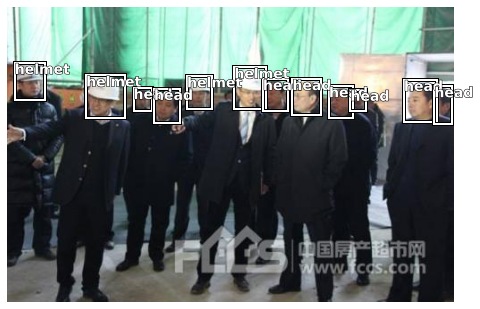

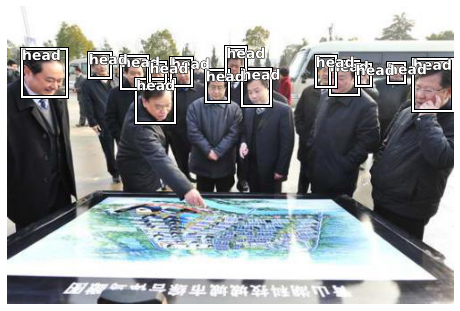

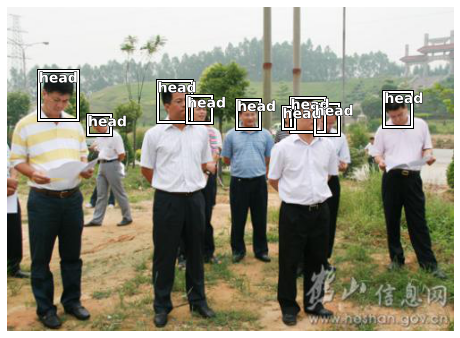

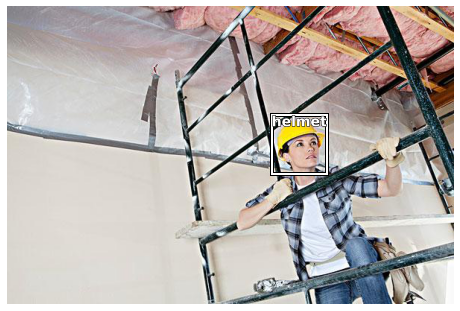

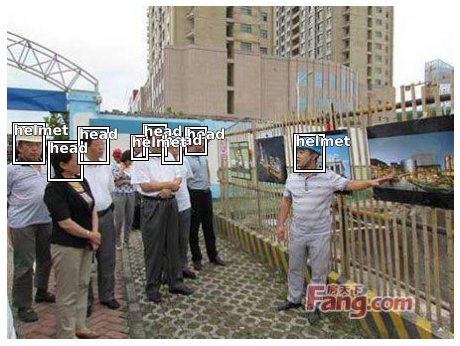

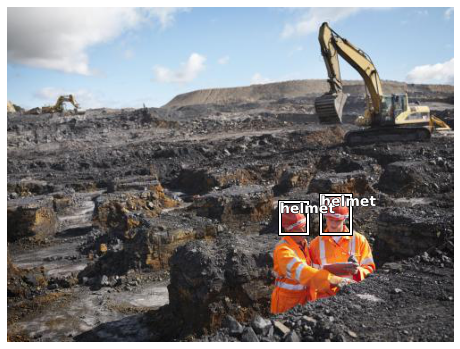

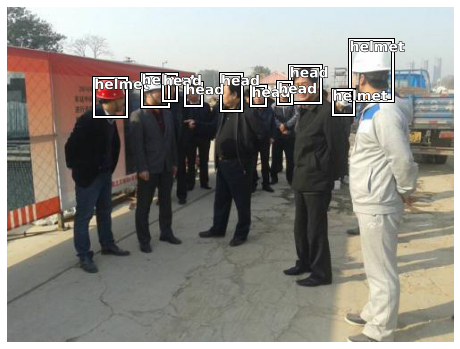

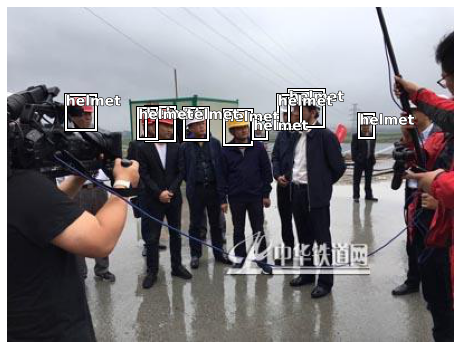

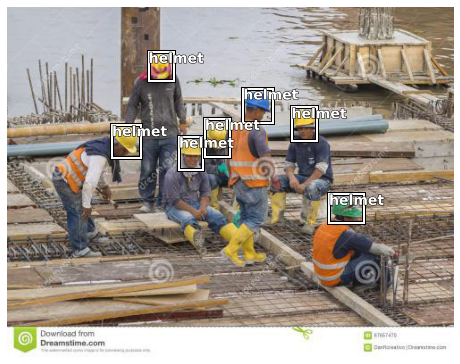

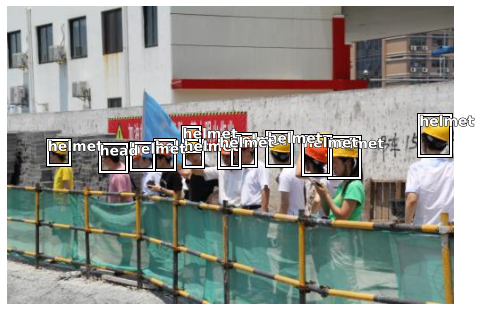

In [24]:
i = 0
while i < 10:
    show_sam(random.randint(0,5268))
    i += 1

create Data Batch

In [25]:
get_y_func = lambda o: hat2bbox[Path(o).name] 

In [26]:
tfms = 5
size = 512

In [27]:
data = (ObjectItemList.from_df(dframe ,path_all, folder = 'train' ,cols='file_name')
        #Where are the images? ->
        .split_by_rand_pct()                          
        #How to split in train/valid? -> randomly with the default 20% in valid
        .label_from_func(get_y_func)
        #How to find the labels? -> use get_y_func on the file name of the data
        .transform(size=size,tfm_y=True)
        #Data augmentation? -> Standard transforms; also transform the label images
        .databunch(bs=8, collate_fn=bb_pad_collate))  

C:\Anaconda3\lib\site-packages\fastai\core.py:302: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(a, dtype=dtype, **kwargs)
C:\Anaconda3\lib\site-packages\fastai\torch_core.py:83: UserWarning: Tensor is int32: upgrading to int64; for better performance use int64 input
  warn('Tensor is int32: upgrading to int64; for better performance use int64 input')


C:\Anaconda3\lib\site-packages\fastai\torch_core.py:83: UserWarning: Tensor is int32: upgrading to int64; for better performance use int64 input
  warn('Tensor is int32: upgrading to int64; for better performance use int64 input')


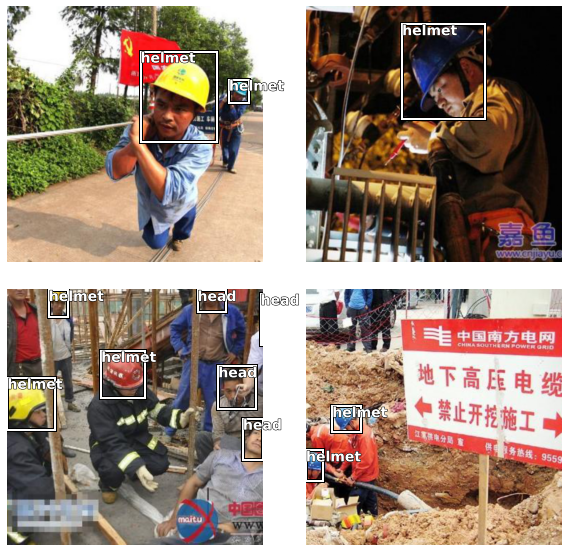

In [28]:
data.show_batch(rows=2,  figsize=(8,8))

In [29]:
len(data.train_ds),len(data.valid_ds),data.classes

(4216, 1053, ['background', 'head', 'helmet'])

In [30]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.3, 0.6, 1.2, 2, 2.8, 3.4,])

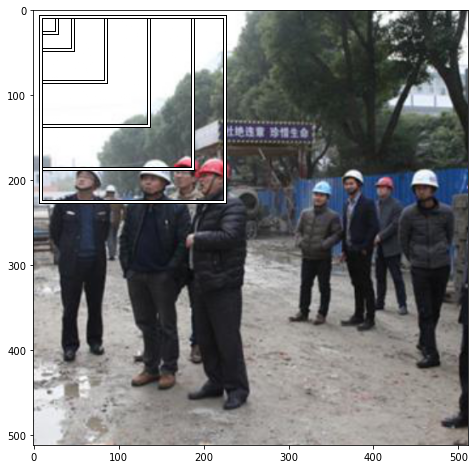

In [31]:
fig,ax = plt.subplots(figsize=(8,8))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:6]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

In [32]:
len(anchors)


6144

Now create the network. Note that for this step, internet access is required, since fast.ai wants to download the pre-trained weights for the ResNet18 stem.

In [33]:
n_classes = data.train_ds.c

crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=6, sizes=[32], chs=32, final_bias=-4., n_conv=3)
voc = PascalVOCMetric(anchors, size, [i for i in data.train_ds.y.classes[1:]])
learn = Learner(data, model, 
                loss_func=crit, 
                callback_fns=[BBMetrics],
                metrics=[voc],
                model_dir='D:/Thirumalai/72075/04032022/TESTING')

In [34]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [35]:
gc.collect()

49184

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-head,AP-helmet,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


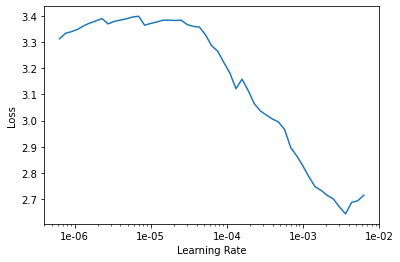

In [36]:
learn.lr_find()
learn.recorder.plot()


the loss was very good starting from 1e-03

In [37]:
learn.fit_one_cycle(2, 1e-3 , callbacks = [ SaveModelCallback(learn, every ='improvement', monitor = 'AP-helmet', name = 'best_model' ) ] )

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-head,AP-helmet,time
0,0.754054,0.631513,0.502865,0.227452,0.404061,0.387314,0.618415,41:24
1,0.339938,0.343557,0.609240,0.126037,0.217521,0.542757,0.675724,41:00


Better model found at epoch 0 with AP-helmet value: 0.6184152097142657.
Better model found at epoch 1 with AP-helmet value: 0.6757237661095512.


In [38]:
learn.load('best_model');
learn.export('D:/Thirumalai/72075/04032022/TESTING/safetyHelmet.pkl');

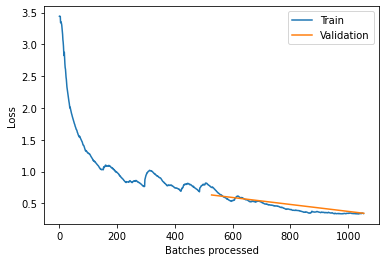

In [39]:
learn.recorder.plot_losses()


In [40]:
learn.unfreeze()
learn.fit_one_cycle(2, 1e-3, callbacks = [SaveModelCallback(learn, every ='improvement', monitor ='AP-helmet', name ='best_model_ft')] )

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-head,AP-helmet,time
0,0.721102,0.646499,0.417820,0.180556,0.465943,0.213688,0.621951,48:03
1,0.361119,0.369069,0.619513,0.129846,0.239223,0.565442,0.673584,46:28


Better model found at epoch 0 with AP-helmet value: 0.6219508891124309.
Better model found at epoch 1 with AP-helmet value: 0.6735840406017042.


In [41]:
learn.load('best_model_ft');
learn.export('D:/Thirumalai/72075/04032022/TESTING/safetyHelmet_ft.pkl');

C:\Anaconda3\lib\site-packages\fastai\torch_core.py:83: UserWarning: Tensor is int32: upgrading to int64; for better performance use int64 input
  warn('Tensor is int32: upgrading to int64; for better performance use int64 input')


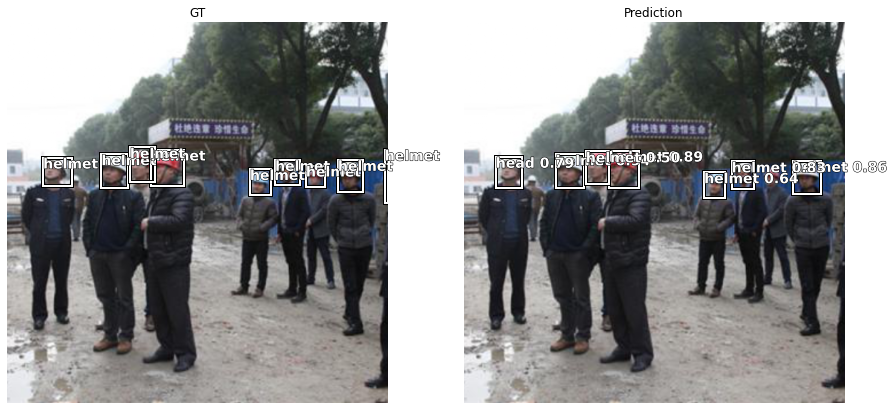

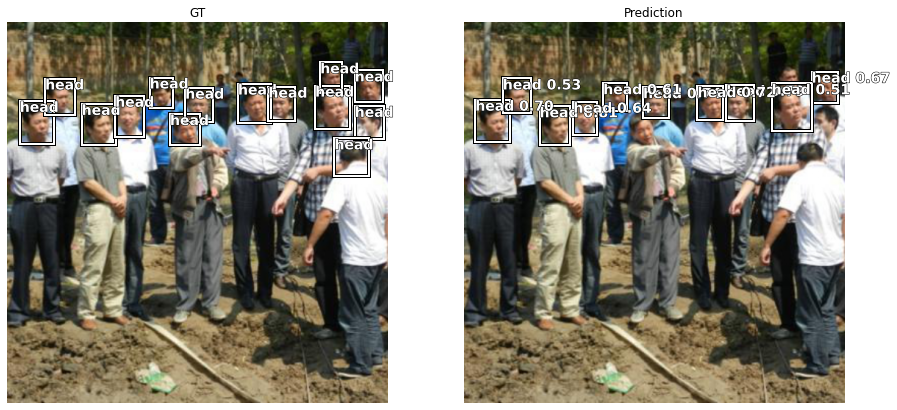

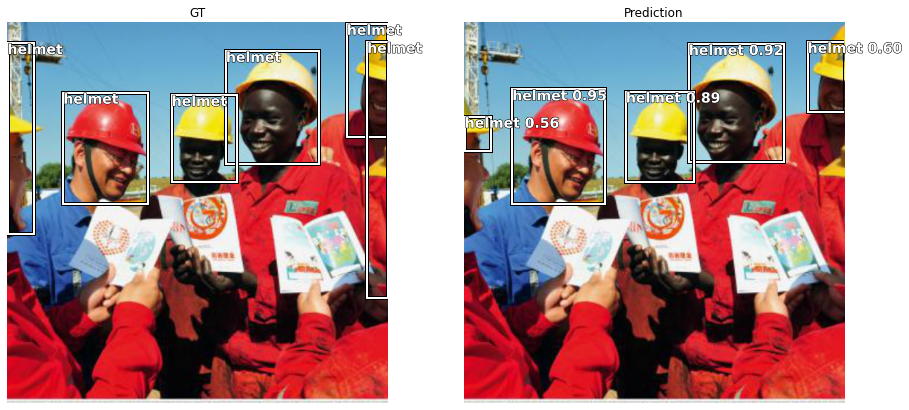

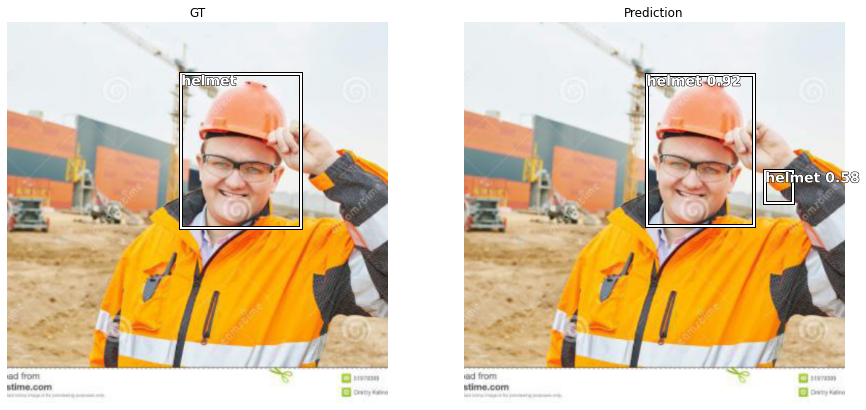

In [42]:
show_results_side_by_side(learn, anchors, detect_thresh=0.5, nms_thresh=0.1, image_count=4)

In [43]:
import scipy.sparse as sparse


In [44]:
def predict(learn: Learner, anchors, detect_thresh:float=0.2, nms_thresh: float=0.3,  image_count: int=2000):

    with torch.no_grad():
        img_batch, target_batch = learn.data.one_batch(DatasetType.Valid, False, False, False)

        prediction_batch = learn.model(img_batch[:image_count])
        class_pred_batch, bbox_pred_batch = prediction_batch[:2]

        bbox_gt_batch, class_gt_batch = target_batch[0][:image_count], target_batch[1][:image_count]

        for img, bbox_gt, class_gt, clas_pred, bbox_pred in list(
                zip(img_batch, bbox_gt_batch, class_gt_batch, class_pred_batch, bbox_pred_batch)):
            if hasattr(learn.data, 'stats'):
                img = Image(learn.data.denorm(img))
            else:
                img = Image(img)

            bbox_pred, scores, preds = process_output(clas_pred, bbox_pred, anchors, detect_thresh)
            if bbox_pred is not None:
                to_keep = nms(bbox_pred, scores, nms_thresh)
                bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()

            t_sz = torch.Tensor([*img.size])[None].cpu()
            bbox_gt = bbox_gt[np.nonzero(class_gt)].squeeze(dim=1).cpu()
            class_gt = class_gt[class_gt > 0] - 1
            # change gt from x,y,x2,y2 -> x,y,w,h
            bbox_gt[:, 2:] = bbox_gt[:, 2:] - bbox_gt[:, :2]

            bbox_gt = to_np(rescale_boxes(bbox_gt, t_sz))
            if bbox_pred is not None:
                bbox_pred = to_np(rescale_boxes(bbox_pred, t_sz))
                # change from center to top left
                bbox_pred[:, :2] = bbox_pred[:, :2] - bbox_pred[:, 2:] / 2


            #show_results(img, bbox_pred, preds, scores, learn.data.train_ds.classes[1:] , bbox_gt, class_gt, (15, 15), titleA="GT", titleB="Prediction")
            
            #d = {'bbox_pred':sparse.coo_matrixb(box_pred), 'scores':sparse.coo_matrix(scores),'class':sparse.coo_matrix(learn.data.train_ds.classes[1:])}
            #output_df = pd.DataFrame(data=d)
            #output_df = pd.DataFrame(data)
            #arr = sparse.coo_matrix(bbox_pred)
            #df['bbox_pred'] = arr.toarray().tolist()
            #print(bbox_pred.type())
            #output_df  = pd.DataFrame(np.array([bbox_pred, scores, learn.data.train_ds.classes[1:]]),
                   #columns=['a', 'b', 'c'])
            
            #output_df 
            #print(bbox_pred.shape[0])
            #print(len(scores))
            #print(len(learn.data.train_ds.classes[1:]))
            #bbox_pred = np.array(bbox_pred)
            scores = np.array(scores)
            #classs = np.array(learn.data.train_ds.classes[1:])
            #d = {'classs':[classs],'bbox_pred':[bbox_pred],'confidence':[scores]}
            #output_df = pd.DataFrame(data=d)
            #print(output_df)
            #print(bbox_pred)
            #print(output_df.shape)
            #print(preds)  #how many predictions per image
            print(scores)

            

In [45]:
predict(learn, anchors, detect_thresh=0.5, nms_thresh=0.1, image_count=5)

C:\Anaconda3\lib\site-packages\fastai\torch_core.py:83: UserWarning: Tensor is int32: upgrading to int64; for better performance use int64 input
  warn('Tensor is int32: upgrading to int64; for better performance use int64 input')


[0.943502 0.891812 0.863257 0.82792  0.785656 0.643233 0.504562]
[0.813991 0.794064 0.737922 0.719857 0.695491 0.669768 0.639929 0.610829 0.531511 0.506018]
[0.949066 0.919147 0.891306 0.59593  0.556511]
[0.920969 0.582973]
[0.890067 0.889291]


In [46]:
data.train_ds

LabelList (4216 items)
x: ObjectItemList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ObjectCategoryList
ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512),ImageBBox (512, 512)
Path: D:\Thirumalai\72075\04032022\TESTING

In [47]:
print(data.valid_ds.x.items[:])

['D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\002523_jpg.rf.d703d51f9dd6717947bc06c77480e4ab.jpg'
 'D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\003395_jpg.rf.ec8947313da36a4dc65e5e09390b0ee7.jpg'
 'D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\005156_jpg.rf.a1763c16771cf954eccc46a9bcd6bd74.jpg'
 'D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\004451_jpg.rf.e919263a6da41081c939551e98f84be5.jpg' ...
 'D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\000575_jpg.rf.73d1944b2250f0c199eb93f5727be8b7.jpg'
 'D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\002334_jpg.rf.b01300f3aa62fa6f7f8a130cef55f2c9.jpg'
 'D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\005119_jpg.rf.963e9e8eed9bd54147c989361ec458b3.jpg'
 'D:\\Thirumalai\\72075\\04032022\\TESTING\\train\\005178_jpg.rf.8f4335de34147e72e4215070b6f7fdcf.jpg']


In [48]:
!git clone https://github.com/fizyr/keras-retinanet.git


'git' is not recognized as an internal or external command,
operable program or batch file.


In [49]:
!pip install --upgrade keras


In [50]:
%cd keras-retinanet/

!pip install .

[WinError 2] The system cannot find the file specified: 'keras-retinanet/'
D:\Thirumalai\72075\04032022\TESTING\hard-hat-detection-master


ERROR: Directory '.' is not installable. Neither 'setup.py' nor 'pyproject.toml' found.


In [51]:
!python setup.py build_ext --inplace


python: can't open file 'setup.py': [Errno 2] No such file or directory


In [52]:
!pip install gdown
!pip install tensorflow-gpu

  Using cached gdown-4.4.0.tar.gz (14 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for gdown: filename=gdown-4.4.0-py3-none-any.whl size=14775 sha256=f94a87fa9e81b78f3ccd8d2b58b5d5db8b1486c7ac786f6459c4f8b11e0d025c
  Stored in directory: c:\users\admin\appdata\local\pip\cache\wheels\7b\7b\5d\656f46cd6889e4c93977be9586901d0adc1271b2d876c84c96
Successfully built gdown


In [53]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image

#from keras_retinanet import models
#from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
#from keras_retinanet.utils.visualization import draw_box, draw_caption
#from keras_retinanet.utils.colors import label_color

%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [54]:
os.makedirs("snapshots", exist_ok=True)


In [55]:
!gdown --id 1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R --output snapshots/resnet50_csv_10.h5

c:\anaconda3\lib\site-packages\gdown\cli.py:127: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R
To: D:\Thirumalai\72075\04032022\TESTING\hard-hat-detection-master\snapshots\resnet50_csv_10.h5

  0%|          | 0.00/249M [00:00<?, ?B/s]
  0%|          | 524k/249M [00:00<01:28, 2.80MB/s]
  1%|          | 1.57M/249M [00:00<00:45, 5.45MB/s]
  1%|1         | 2.62M/249M [00:00<00:37, 6.65MB/s]
  1%|1         | 3.67M/249M [00:00<00:33, 7.29MB/s]
  2%|2         | 5.24M/249M [00:00<00:29, 8.30MB/s]
  3%|2         | 6.29M/249M [00:00<00:28, 8.63MB/s]
  3%|2         | 7.34M/249M [00:00<00:27, 8.81MB/s]
  3%|3         | 8.39M/249M [00:01<00:26, 9.06MB/s]
  4%|4         | 9.96M/249M [00:01<00:25, 9.43MB/s]
  4%|4         | 11.0M/249M [00:01<00:25, 9.28MB/s]
  5%|4         | 12.1M/249M [00:01<00:36, 6.40MB

In [56]:

train_df, test_df = train_test_split(
  df, 
  test_size=0.2, 
  random_state=RANDOM_SEED
)

In [69]:
ANNOTATIONS_FILE = 'annotations.csv'
CLASSES_FILE = 'classes.csv'

In [67]:
train_df.to_csv(ANNOTATIONS_FILE, index=False, header=None)
#train_df2.to_csv(classfile, index=False, header=None)

In [ ]:
classes = set(['head','helmet','person'])

with open(CLASSES_FILE, 'w') as f:
    for i, line in enumerate(sorted(classes)):
        f.write('{},{}\n'.format(line,i))

In [70]:
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to ./snapshots/_pretrained_model.h5


In [71]:
!ls snapshots

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [85]:
import pyximport
pyximport.install()
from keras_retinanet import models
from keras.models import load_model
from keras.preprocessing.image import img_to_array
from keras.applications import imagenet_utils
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
model_path = os.path.join('D:/Thirumalai/72075/04032022/TESTING/hard-hat-detection-master/snapshots/', sorted(os.listdir('snapshots'), reverse=True)[0])
print(model_path)

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

labels_to_names = pd.read_csv(CLASSES_FILE, header=None).T.loc[0].to_dict()

D:/Thirumalai/72075/04032022/TESTING/hard-hat-detection-master/snapshots/resnet50_csv_10.h5


ImportError: Building module keras_retinanet.utils.compute_overlap failed: ['distutils.errors.DistutilsPlatformError: Unable to find vcvarsall.bat\n']

In [88]:
!mkdir weights
!wget -O /content/weights/resnet50_coco_best_v2.h5 https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5

A subdirectory or file weights already exists.
'wget' is not recognized as an internal or external command,
operable program or batch file.


In [89]:
def predict(image):
  image = preprocess_image(image.copy())
  image, scale = resize_image(image)

  boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(image, axis=0)
  )

  boxes /= scale

  return boxes, scores, labels

In [90]:
THRES_SCORE = 0.6

def draw_detections(image, boxes, scores, labels):
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
    if score < THRES_SCORE:
        break

    color = label_color(label)

    b = box.astype(int)
    draw_box(image, b, color=color)

    caption = "{} {:.3f}".format(labels_to_names[label], score)
    draw_caption(image, b, caption)

In [91]:
def show_detected_objects(image_row):
  img_path = image_row.image_name
  
  image = read_image_bgr(img_path)

  boxes, scores, labels = predict(image)

  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  true_box = [
    image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
  ]
  draw_box(draw, true_box, color=(255, 255, 0))

  draw_detections(draw, boxes, scores, labels)

  plt.axis('off')
  plt.imshow(draw)
  plt.show()
  

In [92]:
test_df.head(n=10)


,filename,xmin,ymin,xmax,ymax,class
19805,000886_jpg.rf.fa276ff4287881a32e645d9d3a235817...,239,66,298,143,head
12704,004819_jpg.rf.a17c8144556b6652931ed63d1b944134...,376,71,399,93,helmet
14649,003440_jpg.rf.b86e5afd7f8b9902aca3798086af746d...,355,27,421,104,helmet
8918,004682_jpg.rf.737193e2b058c025e0bab9bf125cc561...,203,76,226,107,head
14592,003356_jpg.rf.b81556b2ff6a12815760d9ee28866ed6...,241,134,256,152,head
14464,000366_jpg.rf.b592a075ba6dbf9adb10269fb86e9d26...,270,32,311,89,head
3474,002078_jpg.rf.2d052e0daaf778aa5ae4beeb96ab85bf...,184,210,203,234,helmet
18014,004323_jpg.rf.e3fbf9b4a4ac69ff990c60db5ce88625...,267,175,285,202,head
9012,000367_jpg.rf.759bc65af1d3172de731247a5095a3fd...,99,41,228,203,helmet
18064,004991_jpg.rf.e42b3934bd3dd7257ca3a4bd643c131a...,305,85,347,142,helmet


In [93]:
test_df['confidence'] = 0.99202

<ipython-input-93-8d266f81c33c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['confidence'] = 0.99202


In [94]:
test_df= test_df [['filename','class','confidence','xmin','ymin','xmax','ymax']]


In [95]:
test_df.head(n=3)

,filename,class,confidence,xmin,ymin,xmax,ymax
19805,000886_jpg.rf.fa276ff4287881a32e645d9d3a235817...,head,0.99202,239,66,298,143
12704,004819_jpg.rf.a17c8144556b6652931ed63d1b944134...,helmet,0.99202,376,71,399,93
14649,003440_jpg.rf.b86e5afd7f8b9902aca3798086af746d...,helmet,0.99202,355,27,421,104


In [96]:
#from google.colab import files

test_df.to_csv('hard_hat_df.csv', index=False)
#files.download('hard_hat_df.csv')
print(test_df.to_csv)

<bound method NDFrame.to_csv of                                                 filename   class  confidence  \
19805  000886_jpg.rf.fa276ff4287881a32e645d9d3a235817...    head     0.99202   
12704  004819_jpg.rf.a17c8144556b6652931ed63d1b944134...  helmet     0.99202   
14649  003440_jpg.rf.b86e5afd7f8b9902aca3798086af746d...  helmet     0.99202   
8918   004682_jpg.rf.737193e2b058c025e0bab9bf125cc561...    head     0.99202   
14592  003356_jpg.rf.b81556b2ff6a12815760d9ee28866ed6...    head     0.99202   
...                                                  ...     ...         ...   
10678  001796_jpg.rf.89e235d7cb8eb1bf7cfa56bf5adfc40b...    head     0.99202   
16640  002075_jpg.rf.d242090f0ca3eafcf5e259a08b2a0145...  helmet     0.99202   
19408  001192_jpg.rf.f4abcb0d1b75adca88b1844fc73d0dcf...  helmet     0.99202   
1277   001801_jpg.rf.10e70d4333aa5db9e98eeb5b4dd363a2...  helmet     0.99202   
19153  001844_jpg.rf.f1714e88af101f0933fb24083734bc78...  helmet     0.99202   

       

C:\Anaconda3\lib\site-packages\fastai\torch_core.py:83: UserWarning: Tensor is int32: upgrading to int64; for better performance use int64 input
  warn('Tensor is int32: upgrading to int64; for better performance use int64 input')


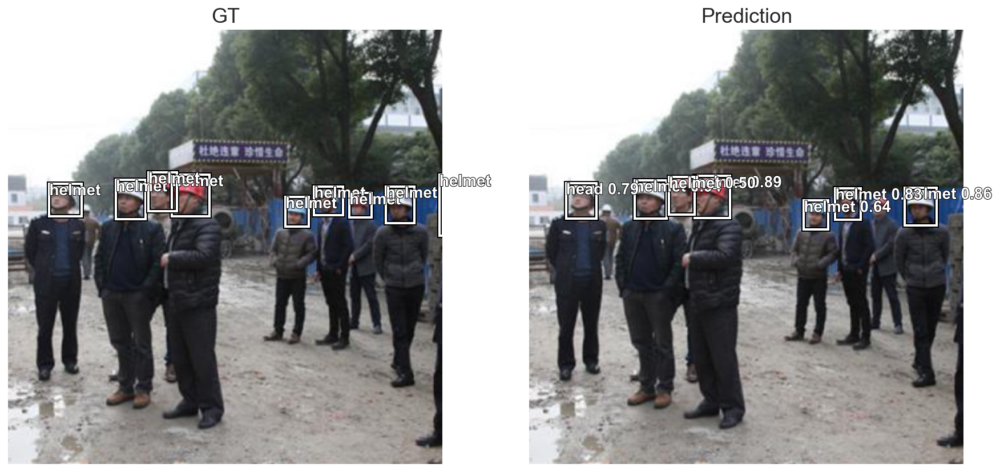

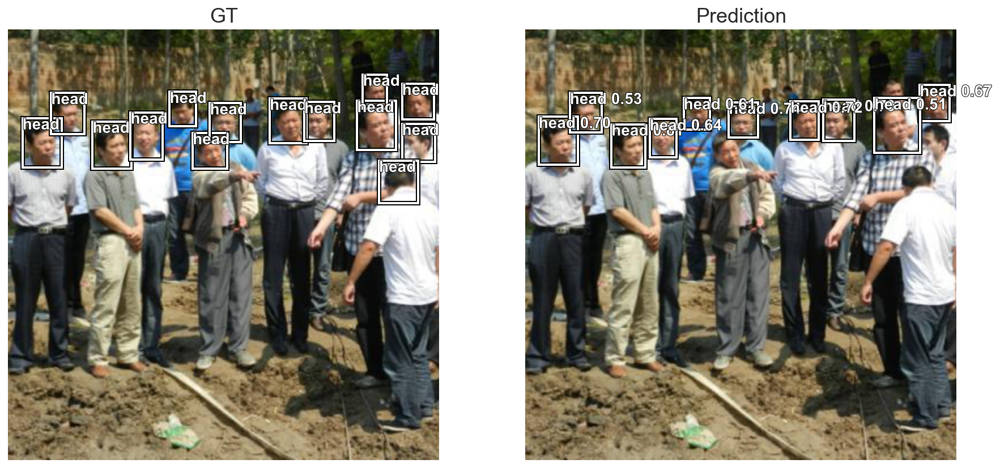

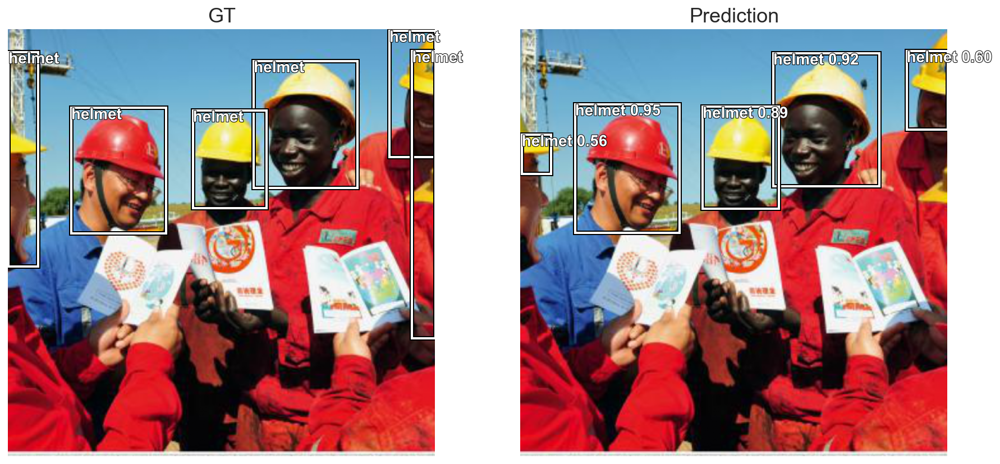

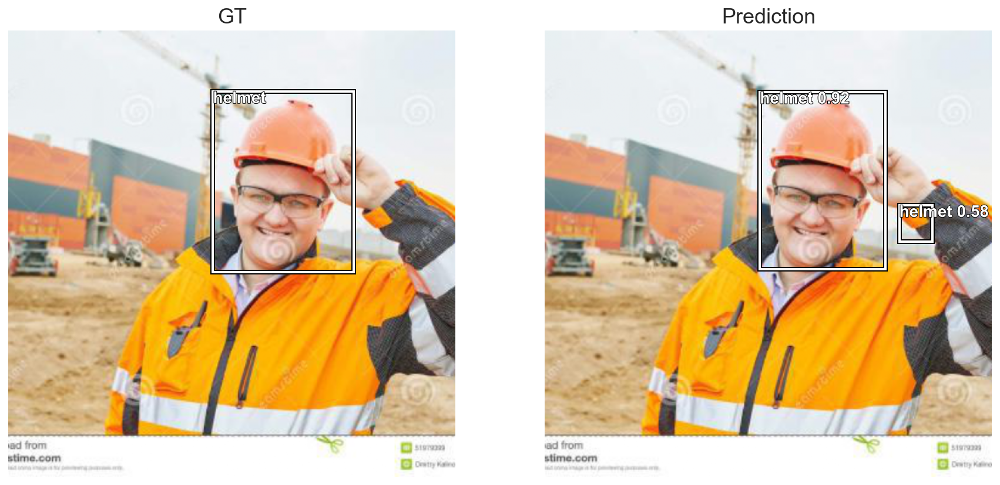

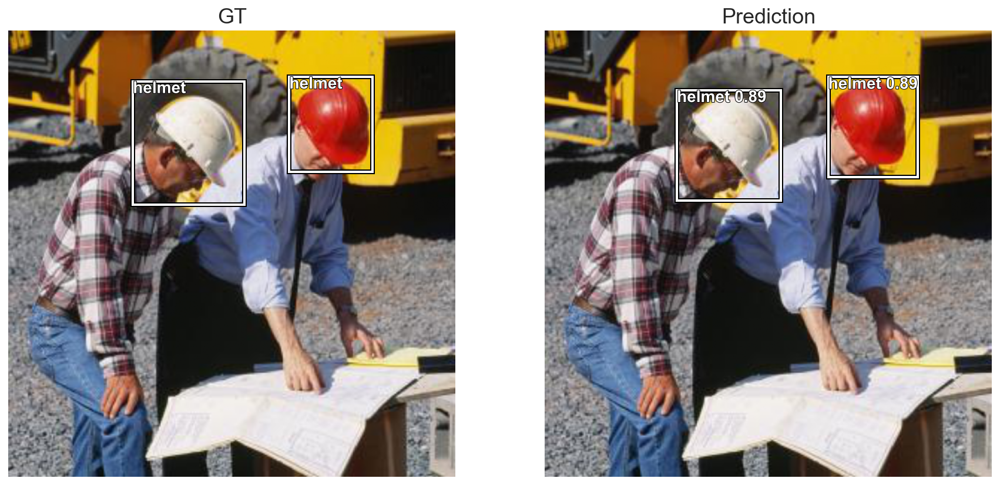

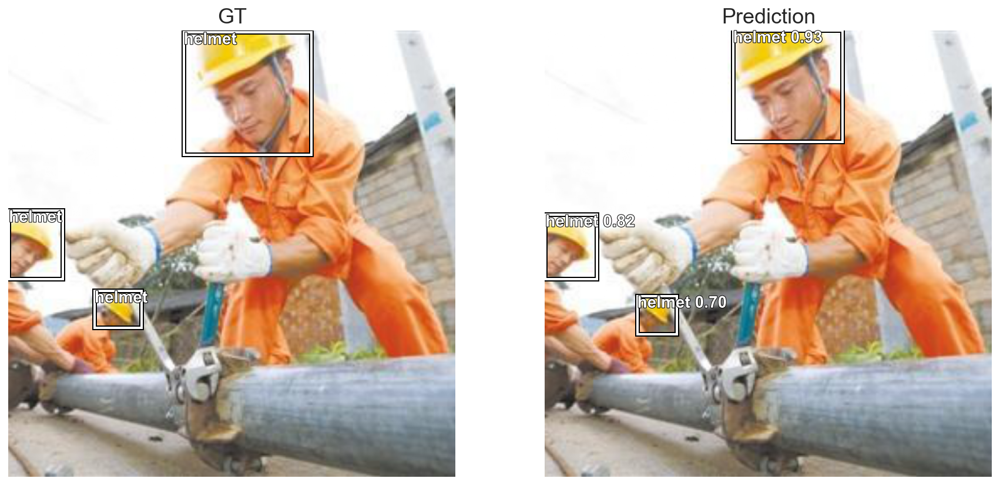

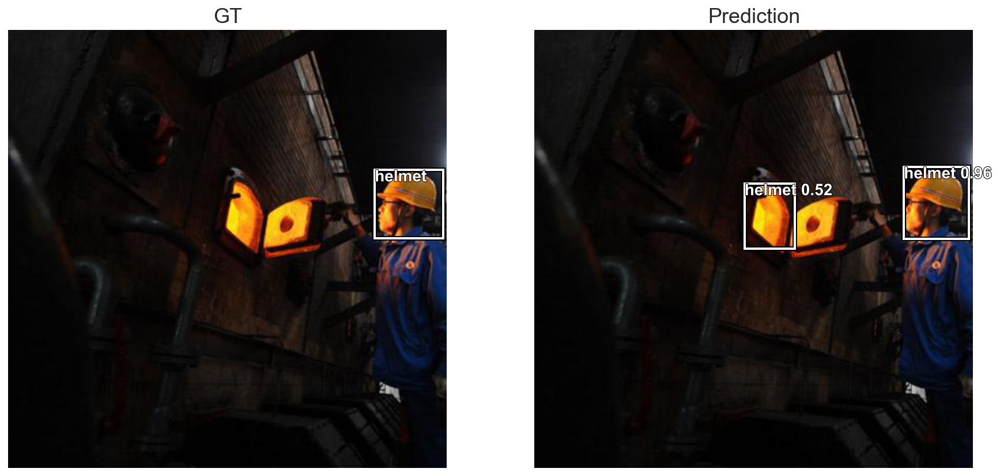

In [97]:
show_results_side_by_side(learn, anchors, detect_thresh=0.5, nms_thresh=0.1, image_count=7)

# Kalman Filter

In [2]:
from kalmanfilter import KalmanFilter
import cv2
# Kalman Filter
kf = KalmanFilter()
img = cv2.imread("D:/Thirumalai/72075/04032022/TESTING/003626_jpg.rf.0024e8fc3c8c3f411962ca8dab7b8e92.jpg")
#print(img)
#print(img)
head_positions1 = [(50, 100), (100, 100), (150, 100), (200, 100), (250, 100), (300, 100), (350, 100), (400, 100), (450, 100)]
#head_positions2 = [(310, 100),(330, 135),(340, 121),(370,158),(199,111),(223,137),(277, 109),(295,132),(154,116),(174,141),
#                  (131,119),(150,141),(122,119),(133,136),(180,120),(195,138)]

head_positions2 = [(149, 100),(205, 173),(100, 115),(163,194),(198,135),(239,213)]
for pt in head_positions2:
    cv2.circle(img, pt, 15, (0, 20, 220), -1)
    predicted = kf.predict(pt[0], pt[1])
    cv2.circle(img, predicted, 15, (20, 220, 0), 4)
#cv2.imshow("Img", img)
#cv2.waitKey(0)
for i in range(10):
    predicted = kf.predict(predicted[0],predicted[1])
    cv2.circle(img,predicted, 15, (20, 220, 0), 4)
    print(predicted)
cv2.imshow("Img", img)
key = cv2.waitKey(1)

(291, 242)
(321, 264)
(351, 286)
(381, 308)
(411, 330)
(441, 352)
(470, 373)
(499, 394)
(528, 415)
(557, 436)
